## Check the setup and connect to the database

In [32]:
%run 'exercise1-check_setup.ipynb'

SAP HANA Client for Python: 2.21.24062400
The file './00-setup/user.ini' exists.
Connection to SAP HANA db at a0f81553-537d-4e3a-808d-fe370ba4095a.hana.prod-eu20.hanacloud.ondemand.com:443 
will be attempted for the user INNOV8ION_USER2
Connected to SAP HANA db version 4.00.000.00.1732009081 (fa/CE2024.28) 
at a0f81553-537d-4e3a-808d-fe370ba4095a.hana.prod-eu20.hanacloud.ondemand.com:443 as user INNOV8ION_USER2
Current time on the SAP HANA server: 2024-12-18 19:50:56.587000


# Tables from SAP HANA

In [33]:
# Optional: enable SQL tracer for artifact generation
# myconn.sql_tracer.enable_sql_trace(True)
# myconn.sql_tracer.enable_trace_history(True)
hdf_titanic_train=myconn.table('TITANIC', schema='DB_1')

# Random Decision Tree classification

Experiment 2: Split into Train and Test for fit

In [34]:
from hana_ml.algorithms.pal.unified_classification import UnifiedClassification

In [35]:
uc_rdt_v2 = UnifiedClassification(func='RandomDecisionTree')

🤓 **Let's discuss**:
- [Train vs Test vs Validation](https://en.wikipedia.org/wiki/Training,_validation,_and_test_data_sets)

Split input dataset into two during [fit()](https://help.sap.com/doc/cd94b08fe2e041c2ba778374572ddba9/2023_3_QRC/en-US/pal/algorithms/hana_ml.algorithms.pal.unified_classification.UnifiedClassification.html#hana_ml.algorithms.pal.unified_classification.UnifiedClassification.fit): training (80%) and testing (the rest) using a column `Survived` and [stratified partition](https://en.wikipedia.org/wiki/Stratified_sampling).

Meaning of partitioning parameters: https://help.sap.com/docs/hana-cloud-database/sap-hana-cloud-sap-hana-database-predictive-analysis-library/partition-partition-af41e5f#ariaid-title3

In [45]:
uc_rdt_v2.fit(
    data=hdf_titanic_train,
    key='PASSENGERID', label='SURVIVED',
    training_percent=0.8,
    partition_method='stratified', stratified_column='SURVIVED', 
    partition_random_state=2,
    output_partition_result=True
);

### Analyze the partition of the table

Get output table names: https://help.sap.com/doc/cd94b08fe2e041c2ba778374572ddba9/2024_1_QRC/en-US/pal/algorithms/hana_ml.algorithms.pal.pal_base.PALBase.html#hana_ml.algorithms.pal.pal_base.PALBase.get_fit_output_table_names

In [37]:
for tab in uc_rdt_v2.get_fit_output_table_names():
    print(f"Table {tab} has {myconn.table(tab).count()} record(s).")

Table #PAL_UNIFIED_CLASSIFICATION_MODEL_2_6613DFB8_BD79_11EF_B907_02E5251BD49B has 275 record(s).
Table #PAL_UNIFIED_CLASSIFICATION_IMPORTANCE_2_6613DFB8_BD79_11EF_B907_02E5251BD49B has 10 record(s).
Table #PAL_UNIFIED_CLASSIFICATION_STATS_2_6613DFB8_BD79_11EF_B907_02E5251BD49B has 12 record(s).
Table #PAL_UNIFIED_CLASSIFICATION_OPT_PARAM_2_6613DFB8_BD79_11EF_B907_02E5251BD49B has 0 record(s).
Table #PAL_UNIFIED_CLASSIFICATION_CONFUSION_MATRIX_2_6613DFB8_BD79_11EF_B907_02E5251BD49B has 4 record(s).
Table #PAL_UNIFIED_CLASSIFICATION_METRICS_2_6613DFB8_BD79_11EF_B907_02E5251BD49B has 174 record(s).
Table #PAL_UNIFIED_CLASSIFICATION_PARTITION_TYPE_2_6613DFB8_BD79_11EF_B907_02E5251BD49B has 891 record(s).
Table #PAL_UNIFIED_CLASSIFICATION_PLACE_HOLDER1_2_6613DFB8_BD79_11EF_B907_02E5251BD49B has 0 record(s).


In [38]:
# A table with the `PARTITION_TYPE` in the name is the result of the partition
dbtable_with_partition_results=next((a_table for a_table in uc_rdt_v2.get_fit_output_table_names() if 'PARTITION_TYPE' in a_table), None)
print(f'The table that stores partition results is {dbtable_with_partition_results}')

myconn.table(dbtable_with_partition_results).collect()

The table that stores partition results is #PAL_UNIFIED_CLASSIFICATION_PARTITION_TYPE_2_6613DFB8_BD79_11EF_B907_02E5251BD49B


,PASSENGERID,TYPE
0,1,1
1,3,1
2,4,1
3,5,1
4,6,1
...,...,...
886,852,2
887,866,2
888,879,2
889,883,2


In [39]:
(myconn
    .table(dbtable_with_partition_results)
    .agg(agg_list=[("count", "TYPE", "TYPE_Count")], group_by="TYPE")
    .sort("TYPE")
    .collect()
)


,TYPE,TYPE_Count
0,1,713
1,2,178


In [40]:
(myconn
    .sql(f'''SELECT TYPE, COUNT(*) AS "COUNT", ROUND(COUNT(*) * 100.0 / SUM(COUNT(*)) OVER (), 3) AS "DISTRIBUTION_PERCENTAGE"
    FROM {dbtable_with_partition_results}
    GROUP BY TYPE;''')
    .sort("TYPE")
    .collect()
)

,TYPE,COUNT,DISTRIBUTION_PERCENTAGE
0,1,713,80.022
1,2,178,19.978


## Generate a model report

##### **Exercise:** Inspect the **Confusion Matrix** in the Unified Classificaiton Report below. Does the model perform well?


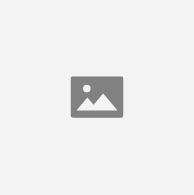

In [41]:
from hana_ml.visualizers.unified_report import UnifiedReport
UnifiedReport(uc_rdt_v2).build().display()

## Debrief the model

In [42]:
from hana_ml.visualizers.model_debriefing import TreeModelDebriefing

In [43]:
TreeModelDebriefing.tree_debrief_with_dot(uc_rdt_v2.model_[0], iframe_height=700);

## <u>**All exercises below are optional! You might want to proceed to exercise 6.**</u>

##  **Optional:** Analyze programmatically the Classifier's...

### ...parameters

In [ ]:
display(uc_rdt_v2.get_parameters())

Now more output tables are populated, incl. Confusion Matrix and Metrics

In [ ]:
for tab in uc_rdt_v2.model_:
    print(f"{tab.select_statement} returns {tab.count()} record(s)")

### ...model

In [ ]:
hdf_uc_rdt_model=uc_rdt_v2.model_[0]
display(hdf_uc_rdt_model.head(3).select(hdf_uc_rdt_model.columns[2]).collect())

...confusion matrix from the training (fitting) execution

In [ ]:
uc_rdt_v2.confusion_matrix_.collect()

🤓 **Let's discuss**:
1. Confusion Matrix
1. Statistics
1. Metrics

### ...statistics 

(see https://help.sap.com/docs/hana-cloud-database/sap-hana-cloud-sap-hana-database-predictive-analysis-library/model-evaluation-model-evaluation-73bbec0)

In [ ]:
uc_rdt_v2.statistics_.filter("STAT_NAME='ACCURACY'").collect()

In [ ]:
# To display all available statistics
uc_rdt_v2.statistics_.collect()

If you want to manualy plot Cumulative Gains:
```python
uc_rdt_v2.metrics_.filter("NAME = 'CUMGAINS'").sort('X').collect().plot(x='X', y='Y');
```

In [ ]:
uc_rdt_v2.metrics_.filter("NAME = 'CUMGAINS'").sort('X').collect().plot(x='X', y='Y');

### ...metrics

In [ ]:
uc_rdt_v2.metrics_.collect()

What metrics are in the table?

In [ ]:
uc_rdt_v2.metrics_.distinct(cols='NAME').collect()

Let's check the CUMulative GAINS

In [ ]:
uc_rdt_v2.metrics_.filter("NAME = 'CUMGAINS'").sort('X').collect()

# **Optional:** Store the model

In [23]:
from hana_ml.model_storage import ModelStorage
from hana_ml.artifacts.generators import hana
from hana_ml.artifacts.generators.hana import HANAGeneratorForCAP

Model storage: https://help.sap.com/doc/cd94b08fe2e041c2ba778374572ddba9/2023_3_QRC/en-US/hana_ml.model_storage.html

In [24]:
ms = ModelStorage(myconn)

In [25]:
uc_rdt_v2.name = 'CodeJam-Titanic-Classification'
uc_rdt_v2.version = 2
ms.save_model(model=uc_rdt_v2, if_exists='replace', save_report=False)

In [ ]:
display(ms.list_models())

In [ ]:
null = None
false = False
true = True
eval(ms.list_models(name=uc_rdt_v2.name).at[0, 'JSON'])

In [ ]:
# Check what table represents your fitted model in this Python session
uc_rdt_v2.model_[0].select_statement

# **Optional:** Load the saved model

In [ ]:
ms.list_models(uc_rdt_v2.name)

In [30]:
uc_rdt_v2=ms.load_model(uc_rdt_v2.name, version=uc_rdt_v2.version)

In [ ]:
uc_rdt_v2.model_[0].select_statement

# **Optional:** Call prediction

In [32]:
hdf_titanic_test=myconn.table('TITANIC_TEST', schema='DB_1')

In [33]:
hdf_res_v2 = uc_rdt_v2.predict(hdf_titanic_test, key = 'PASSENGERID')
# Optional: Generate artifacts
# hg = HANAGeneratorForCAP(project_name="PAL_4CAP_TITANIC", output_dir="./artifacts", namespace="hana.ml")
# hg.generate_artifacts(uc_rdt_v2, model_position=True, cds_gen=False, tudf=True)

In [ ]:
display(hdf_res_v2.select('PASSENGERID', 'SCORE', 'CONFIDENCE').head(4).collect())

# [**Optional**] Compare to the ground truth

In [35]:
hdf_titanic_complete=myconn.table('TITANIC_TRUTH', schema='DB_1')

In [36]:
hdf_res_ext=hdf_res_v2.set_index('PASSENGERID').join(hdf_titanic_test.set_index('PASSENGERID'))

In [ ]:
hdf_res_ext.head(3).collect()

In [38]:
hdf_res_incl_groundtruth=(hdf_res_ext.set_index('PASSENGERID').join(hdf_titanic_complete.set_index('passengerId'))
                 .select('PASSENGERID', 'NAME', 'TICKET', 'SCORE','survived',('1-ABS(SCORE-"survived")', 'IS_CORRECT'))
                 .cast('SCORE', 'INT')

)

In [ ]:
hdf_res_incl_groundtruth.head(3).collect()

## **Optional:** Using `metrics`

In [40]:
import hana_ml.algorithms.pal.metrics as pal_metrics

Accuracy score: https://help.sap.com/doc/cd94b08fe2e041c2ba778374572ddba9/2023_3_QRC/en-US/pal/algorithms/hana_ml.algorithms.pal.metrics.accuracy_score.html#accuracy-score

In [ ]:
pal_metrics.accuracy_score(data=hdf_res_incl_groundtruth, label_true='survived', label_pred='SCORE')

Confusion Matrix: https://help.sap.com/doc/cd94b08fe2e041c2ba778374572ddba9/2023_3_QRC/en-US/pal/algorithms/hana_ml.algorithms.pal.metrics.confusion_matrix.html#confusion-matrix

In [42]:
hdf_cm, hdf_cr = pal_metrics.confusion_matrix(data=hdf_res_incl_groundtruth, key='PASSENGERID', label_true='survived', label_pred='SCORE')

In [ ]:
hdf_cm.collect()

In [ ]:
hdf_cr.collect()

In [ ]:
from hana_ml.visualizers.metrics import MetricsVisualizer
MetricsVisualizer(enable_plotly=False).plot_confusion_matrix(hdf_cm, normalize=False);